# APPLICATION OF ANALYTICS 


In [3]:
import pandas as pd

In [4]:
# Loading the dataset
df = pd.read_csv('players_22.csv')

C:\Users\Prerna Bhatnagar\AppData\Local\Temp\ipykernel_24156\1470770805.py:2: DtypeWarning: Columns (25,108) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('players_22.csv')


Well, not everyone plays football or knows everything about it, so i will write some clarifications.

In football, player positions corresponds to these positions:-

![](https://www.fifplay.com/img/public/positions.jpg)

In this dataset, we have 1 row each for every football player in the game FIFA 22, For every player we have :-
- Name
- Weight
- Height
- Salary
- Overall (This is an overall score of how good the player is)
- Potential (In FIFA, if you play career mode, players evolve and their overall scores improve, potential refers to how good a player can get, not what he is currently)

Then we have most other options like:-
- Heading (How well can the player head the ball)
- Standing tackle (How well can the player do a standing tackle - defense)
- Sliding tackle (How well can the player do a sliding tackle - defense)

And many many more

# Problem Statement

1.First of all some meaningful insights from this dataset. 

2. Suppose you are hired by Real Madrid, and they want you to scout the best players possible
    - They are looking young players, not over 26
    - They are looking for 4 players
        - 1 for Goalkeeper 
        - 1 Defender (Could be any position)
        - 1 Midfielder (Could be any position)
        - 1 Attacker (Could be any position)

# Lets Goo

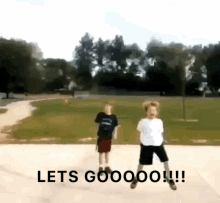

In [5]:
df.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


In [4]:
##Summary Statistics
print(df.describe())

           sofifa_id       overall     potential     value_eur       wage_eur  \
count   19239.000000  19239.000000  19239.000000  1.916500e+04   19178.000000   
mean   231468.086959     65.772182     71.079370  2.850452e+06    9017.989363   
std     27039.717497      6.880232      6.086213  7.613700e+06   19470.176724   
min        41.000000     47.000000     49.000000  9.000000e+03     500.000000   
25%    214413.500000     61.000000     67.000000  4.750000e+05    1000.000000   
50%    236543.000000     66.000000     71.000000  9.750000e+05    3000.000000   
75%    253532.500000     70.000000     75.000000  2.000000e+06    8000.000000   
max    264640.000000     93.000000     95.000000  1.940000e+08  350000.000000   

                age     height_cm     weight_kg   club_team_id  league_level  \
count  19239.000000  19239.000000  19239.000000   19178.000000  19178.000000   
mean      25.210822    181.299704     74.943032   50580.498123      1.354364   
std        4.748235      6.863

In [5]:
##Checking Null Values
print(df.isna().sum())

sofifa_id               0
player_url              0
short_name              0
long_name               0
player_positions        0
                    ...  
player_face_url         0
club_logo_url          61
club_flag_url          61
nation_logo_url     18480
nation_flag_url         0
Length: 110, dtype: int64


In [6]:
# Define list of columns to remove
cols_to_remove = ['player_url', 'long_name','dob', 'club_team_id','club_jersey_number','club_loaned_from','real_face', 'club_contract_valid_until','nationality_id','nation_position','nation_team_id','player_tags','release_clause_eur','nation_jersey_number','player_face_url','club_logo_url','club_flag_url','nation_logo_url','nation_flag_url']

# Drop the columns from the dataset
df.drop(cols_to_remove, axis=1, inplace=True)


In [7]:
top_players = df.sort_values(by='overall', ascending=False).head(10)
print(top_players[['short_name', 'age', 'nationality_name', 'club_name', 'overall']])

          short_name  age nationality_name            club_name  overall
0           L. Messi   34        Argentina  Paris Saint-Germain       93
1     R. Lewandowski   32           Poland    FC Bayern München       92
2  Cristiano Ronaldo   36         Portugal    Manchester United       91
3          Neymar Jr   29           Brazil  Paris Saint-Germain       91
4       K. De Bruyne   30          Belgium      Manchester City       91
5           J. Oblak   28         Slovenia   Atlético de Madrid       91
6          K. Mbappé   22           France  Paris Saint-Germain       91
7           M. Neuer   35          Germany    FC Bayern München       90
8      M. ter Stegen   29          Germany         FC Barcelona       90
9            H. Kane   27          England    Tottenham Hotspur       90


In [81]:
num_players_not_in_club = df['club_name'].isnull().sum()
print(f"There are {num_players_not_in_club} players who are not in any club.")

There are 61 players who are not in any club.


# VISUALIZATIONS

## Importing Libraries

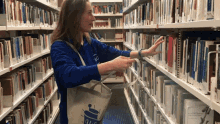

In [22]:
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline

## UNIVARIATE ANALYSIS

<AxesSubplot:title={'center':'Distribution of Height of Players'}, xlabel='height_cm', ylabel='Density'>

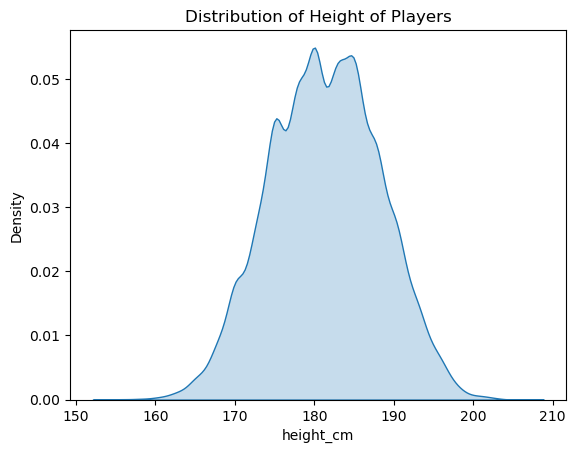

In [28]:
figsize=(8, 8)
plt.title('Distribution of Height of Players')
sns.kdeplot(df['height_cm'],fill=True)

### The most common hieght appears to be around 180-185 cm.There are fewer players who are taller.

C:\Users\Prerna Bhatnagar\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


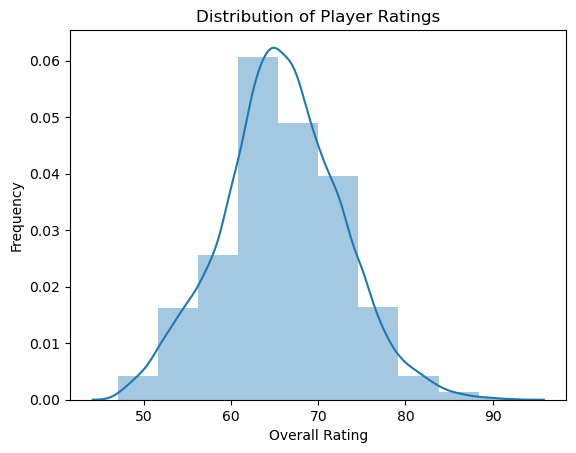

In [29]:
sns.distplot(df['overall'],bins=10)
plt.xlabel('Overall Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Player Ratings')
plt.show()

### The majority of players have an overall rating between 60 and 80, with a peak around 70 and fewer players at the extremes of the rating scale.

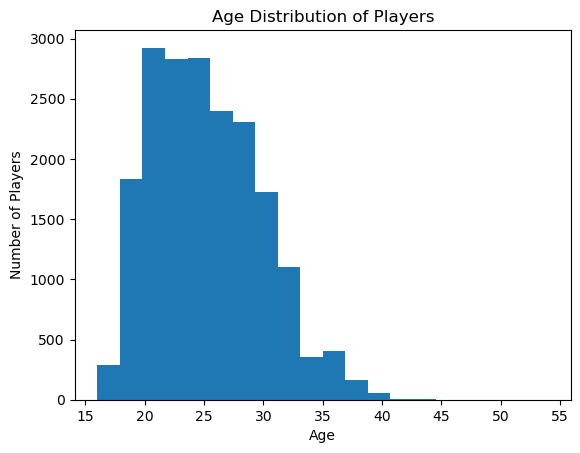

Average Age of Players: 25.21


In [31]:
plt.hist(df['age'], bins=20)
plt.xlabel('Age')
plt.ylabel('Number of Players')
plt.title('Age Distribution of Players')
plt.show()

avg_age = df['age'].mean()
print('Average Age of Players:', round(avg_age, 2))

### The majority of players are between the ages of 20 and 30, with a peak around 24-25 years old.

## Which foot does the footballers in use more?

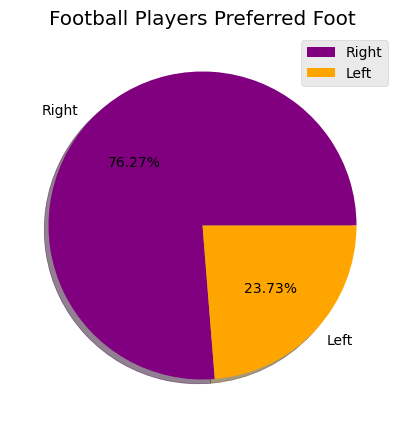

In [87]:
labels = df["preferred_foot"].value_counts().index # (Right,Left) 
values = df["preferred_foot"].value_counts() # (Right Values, Left Values)
explode = (0, 0.1) # used to separate the pie

plt.figure(figsize = (5,5))
color=['purple','orange']
plt.pie(values,labels=labels,colors=color,autopct='%1.2f%%',shadow=True)
plt.title('Football Players Preferred Foot')
plt.legend()
plt.show()

C:\Users\Prerna Bhatnagar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


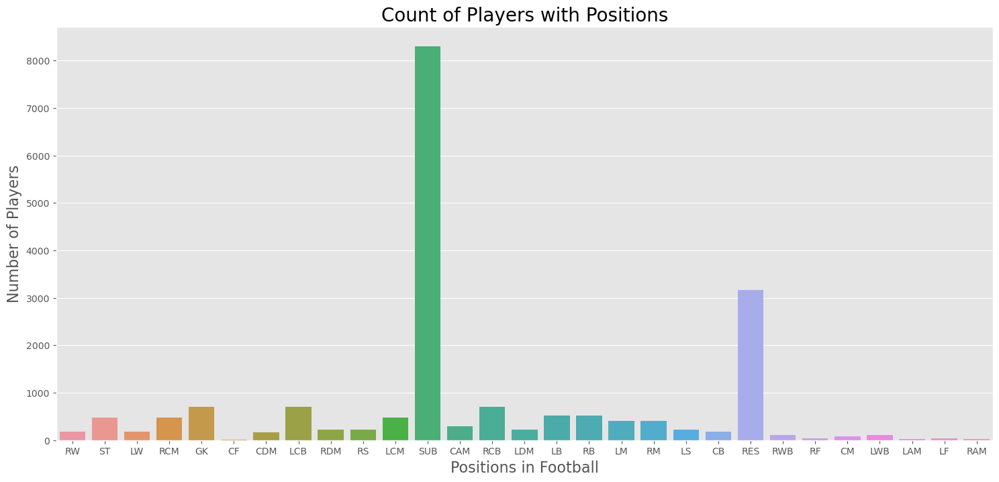

In [42]:
# different positions acquired by the players 

plt.figure(figsize = (18, 8))
plt.style.use('ggplot')
ax = sns.countplot('club_position', data = df,)
ax.set_xlabel(xlabel = 'Positions in Football', fontsize = 16)
ax.set_ylabel(ylabel = 'Number of Players', fontsize = 16)
ax.set_title(label = 'Count of Players with Positions', fontsize = 20)   
plt.show()

### The most common positions are SUB,RES , and RCB, while the least common positions are CF and RAM.

C:\Users\Prerna Bhatnagar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


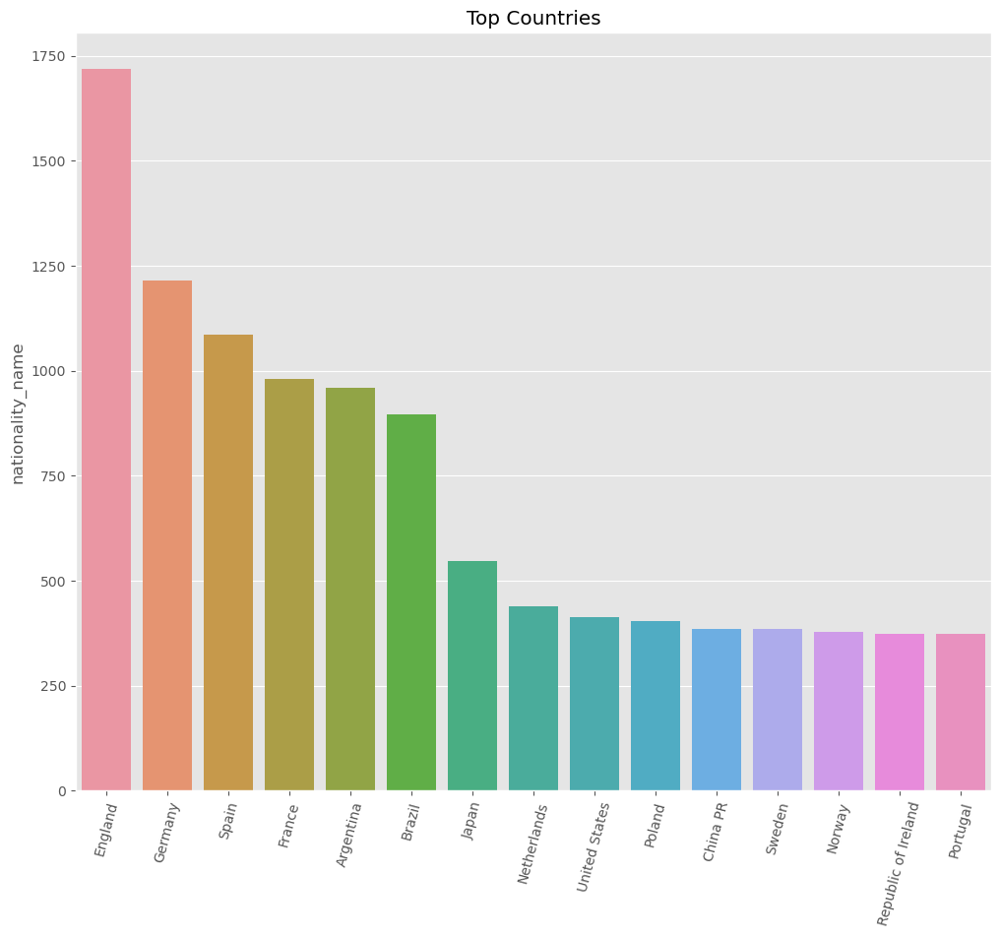

In [51]:
top_countries = df.nationality_name.value_counts().head(15)
plt.figure(figsize=(12,10))
plt.xticks(rotation=75)
plt.title("Top Countries")
sns.barplot(top_countries.index, top_countries);

### From the above graph we can see that England has the highest number of players in Fifa 21, followed by Germany and Spain.

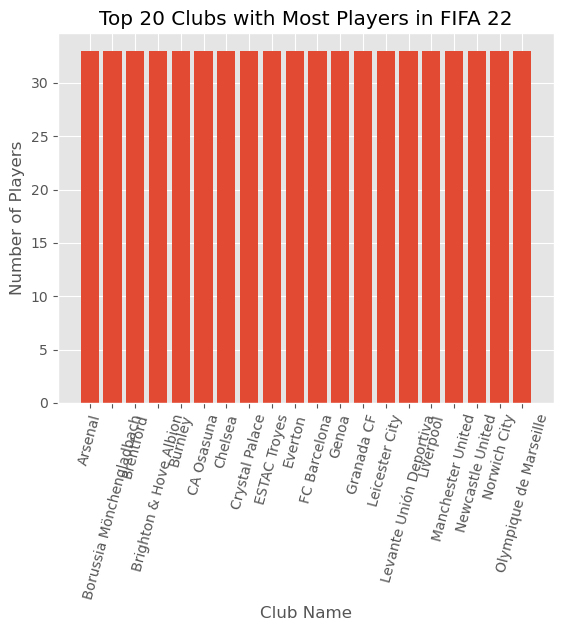

<Figure size 1500x2000 with 0 Axes>

In [74]:
top_clubs = df.groupby('club_name')['short_name'].count().nlargest(20)
plt.xticks(rotation=75)
plt.bar(top_clubs.index,top_clubs.values)
plt.title('Top 20 Clubs with Most Players in FIFA 22')
plt.xlabel('Club Name')
plt.ylabel('Number of Players')
plt.figure(figsize=(15,20))
plt.show()

### In the top 20 category, most of the clubs average 32 players in their teams. 

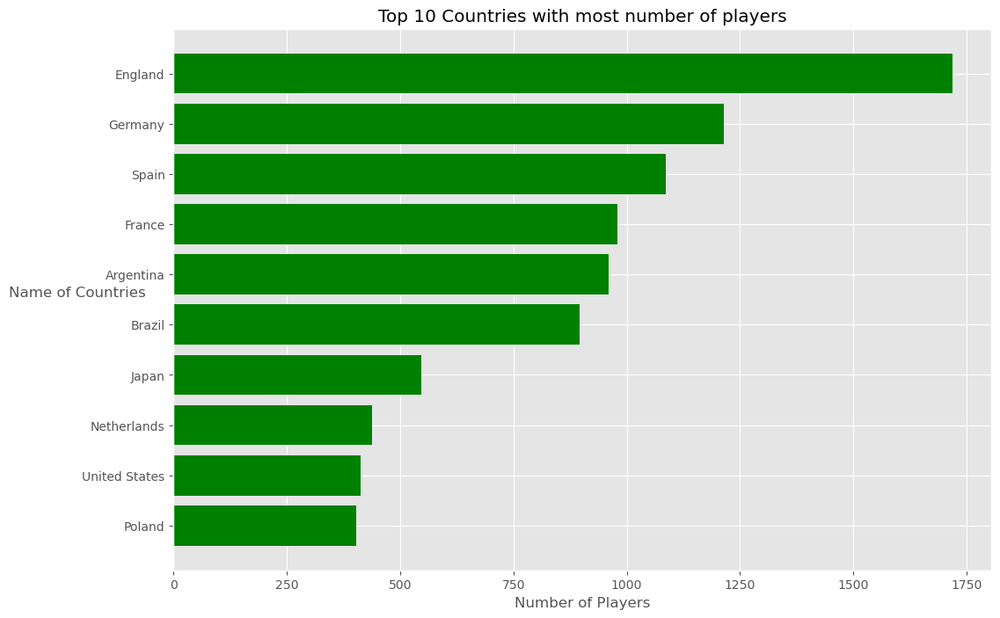

In [112]:
top_countries = df['nationality_name'].value_counts().head(10)
fig, ax = plt.subplots(figsize=(12,8))
x = top_countries.values
y = top_countries.index
ax.barh(y, x, align='center', color='green')
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Number of Players')
ax.set_ylabel('Name of Countries', rotation=0)
ax.set_title('Top 10 Countries with most number of players')
plt.show()

## BIVARIATE ANALYSIS

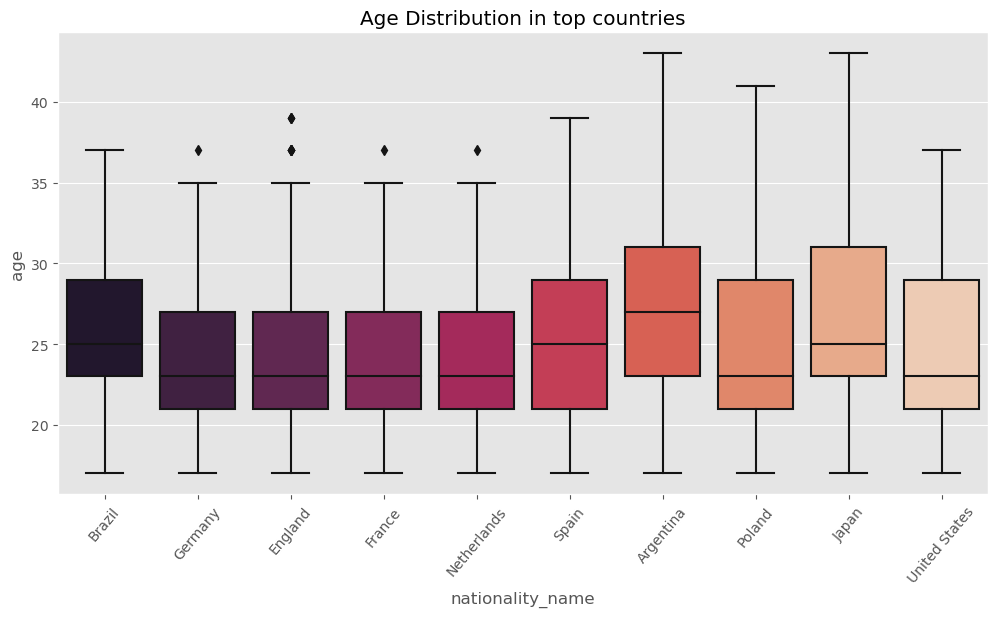

In [114]:
top_countries = df['nationality_name'].value_counts().head(10)
top_countries_name = top_countries.index
df_country_age = df.loc[df['nationality_name'].isin(top_countries_name)& df['age']]
plt.figure(1 , figsize = (12,6))
sns.boxplot(x = 'nationality_name' , y = 'age' , data = df_country_age, palette='rocket')
plt.title('Age Distribution in top countries')
plt.xticks(rotation = 50)
plt.show()

### Germany, England,France and Netherlands have youngest set of players and Argentina have eldest set of players

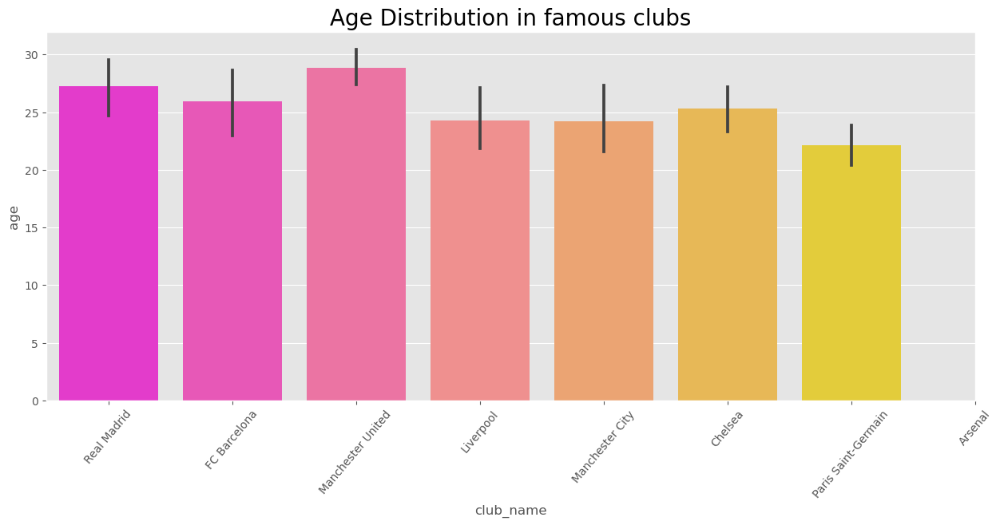

In [121]:
clubs = ['Real Madrid', 'FC Barcelona', 'Manchester United', 'Liverpool','Manchester City','Chelsea', 'Paris Saint-Germain', 'Arsenal',]
df_club_age = df.loc[df['club_name'].isin(clubs) & df['age']]
plt.figure(1 , figsize = (15,6))
sns.barplot(x = 'club_name', y = 'age' , data = df_club_age, palette='spring')
plt.title('Age Distribution in famous clubs',fontsize=20)
plt.xticks(range(len(clubs)), clubs, rotation=50)
plt.show()

### Manchester United has the eldest players and Paris Saint-Germain and Liverpool has youngest players

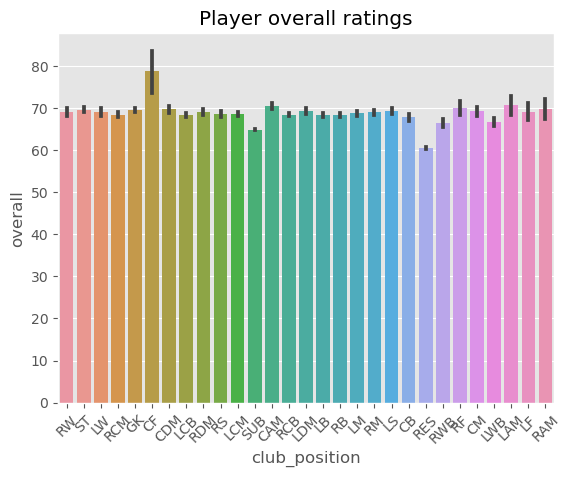

In [135]:
sns.barplot(x="club_position", y="overall", data=df)
plt.title('Player overall ratings')
plt.figure(1 , figsize = (25,20))
plt.xticks(rotation=45)

plt.show()

### Centre forward position players have higher ratings

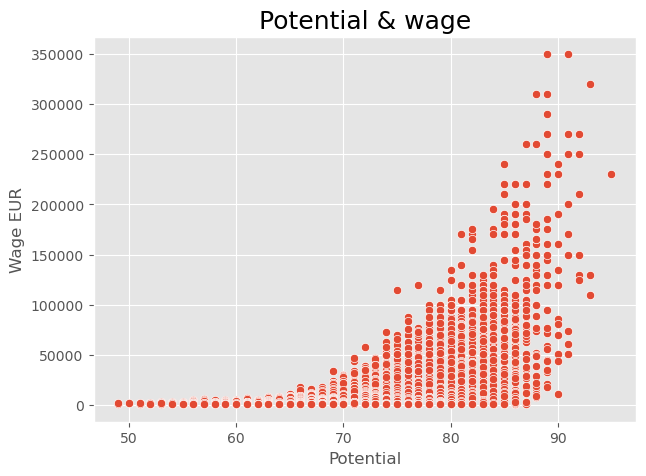

In [137]:
# Let's plot the relationship between player potential and wages

plt.figure(figsize=(7, 5))
ax = sns.scatterplot(x =df['potential'], y = df['wage_eur'])
plt.xlabel("Potential") 
plt.ylabel("Wage EUR")
plt.title("Potential & wage", fontsize = 18)
plt.show()

### Players with high potentials tend to earn more

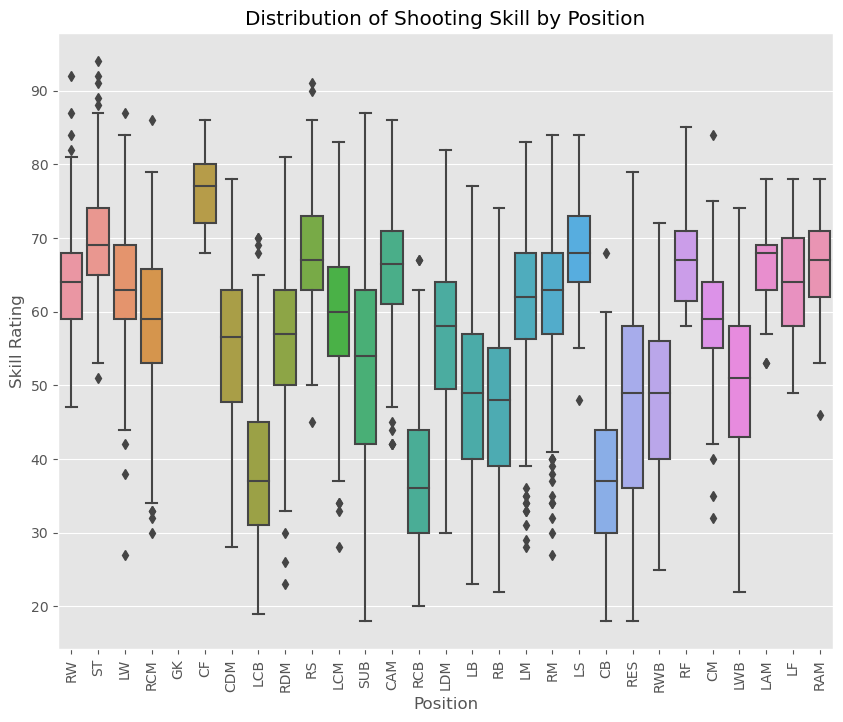

In [138]:
plt.figure(figsize=(10,8))
sns.boxplot(x='club_position', y='shooting', data=df)
plt.xticks(rotation=90)
plt.xlabel('Position')
plt.ylabel('Skill Rating')
plt.title('Distribution of Shooting Skill by Position')
plt.show()

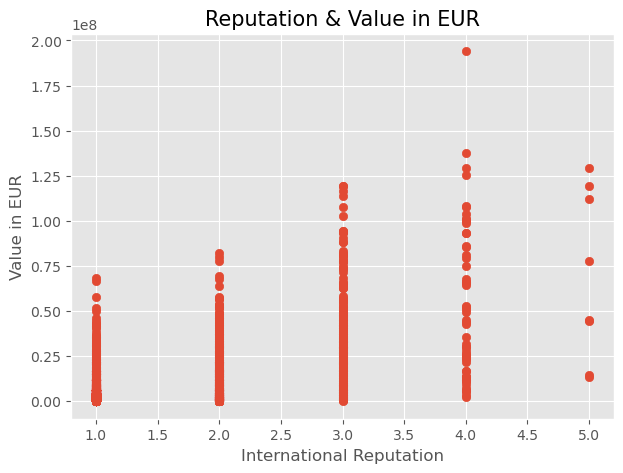

In [140]:
fig, ax = plt.subplots(figsize=(7,5))
plt.scatter(x=df['international_reputation'], y=df['value_eur'] )
plt.xlabel("International Reputation") 
plt.ylabel("Value in EUR")
plt.title("Reputation & Value in EUR", fontsize = 15)

plt.show()

C:\Users\Prerna Bhatnagar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


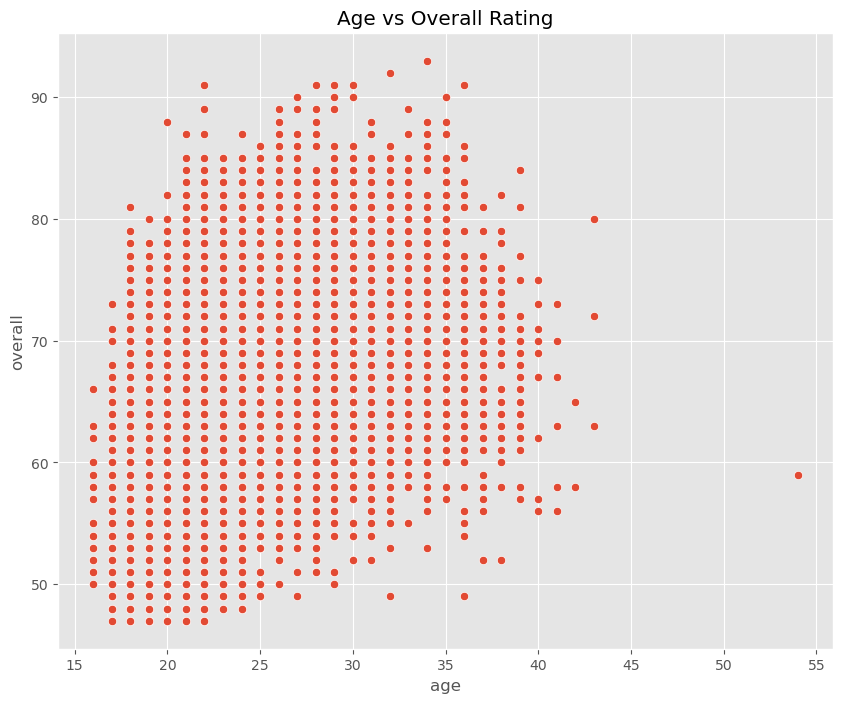

In [143]:
#Scatterplot of overall vs age 
plt.figure(figsize=(10,8))
plt.title('Age vs Overall Rating')

sns.scatterplot(df.age,df.overall);

### There are no players under age 20 who have a rating of more than 80.Players with more than 90 rating are in the age goup of 27 to 35.

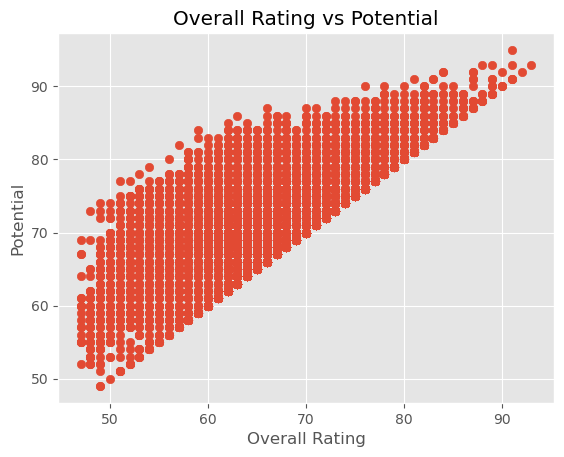

In [144]:
plt.scatter(df['overall'], df['potential'])
plt.xlabel('Overall Rating')
plt.ylabel('Potential')
plt.title('Overall Rating vs Potential')
plt.show()

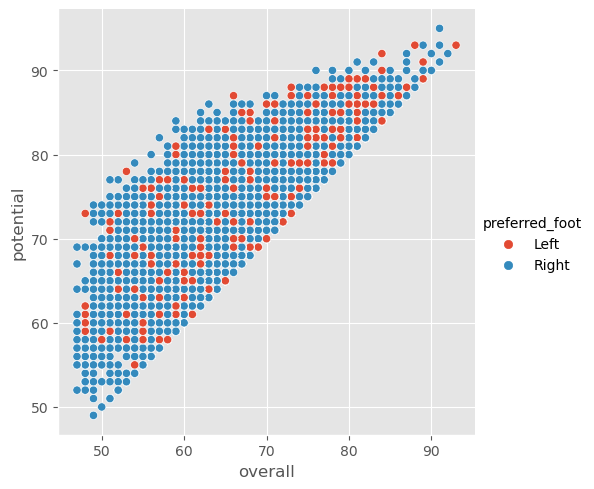

In [146]:
sns.relplot(data=df, x="overall", y="potential", hue="preferred_foot")

### players with high potential prefer right foot

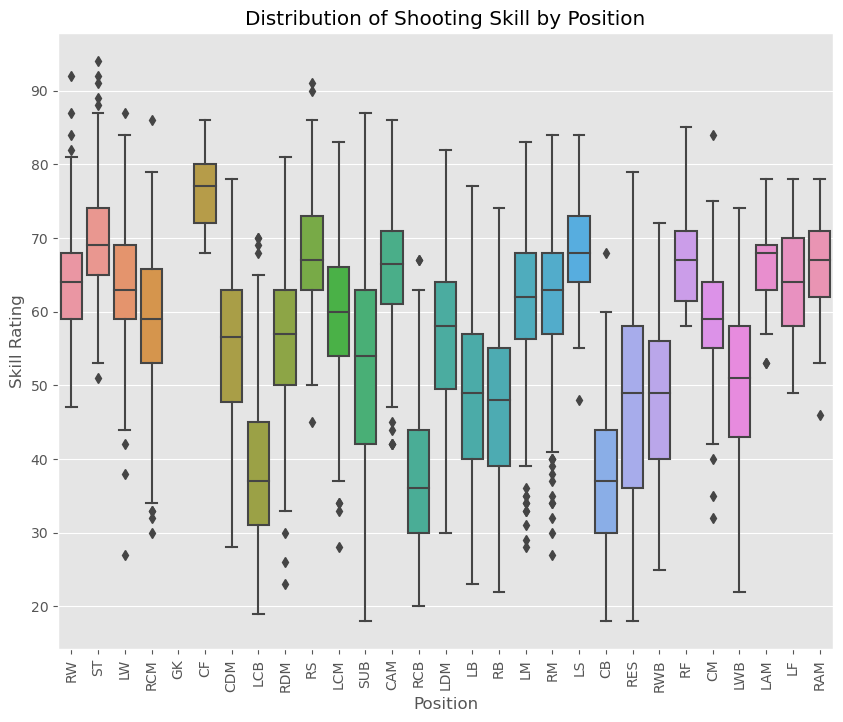

In [148]:
plt.figure(figsize=(10,8))
sns.boxplot(x='club_position', y='shooting', data=df)
plt.xticks(rotation=90)
plt.xlabel('Position')
plt.ylabel('Skill Rating')
plt.title('Distribution of Shooting Skill by Position')
plt.show()

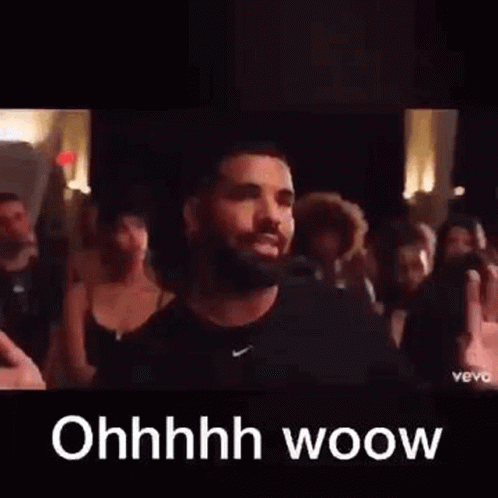

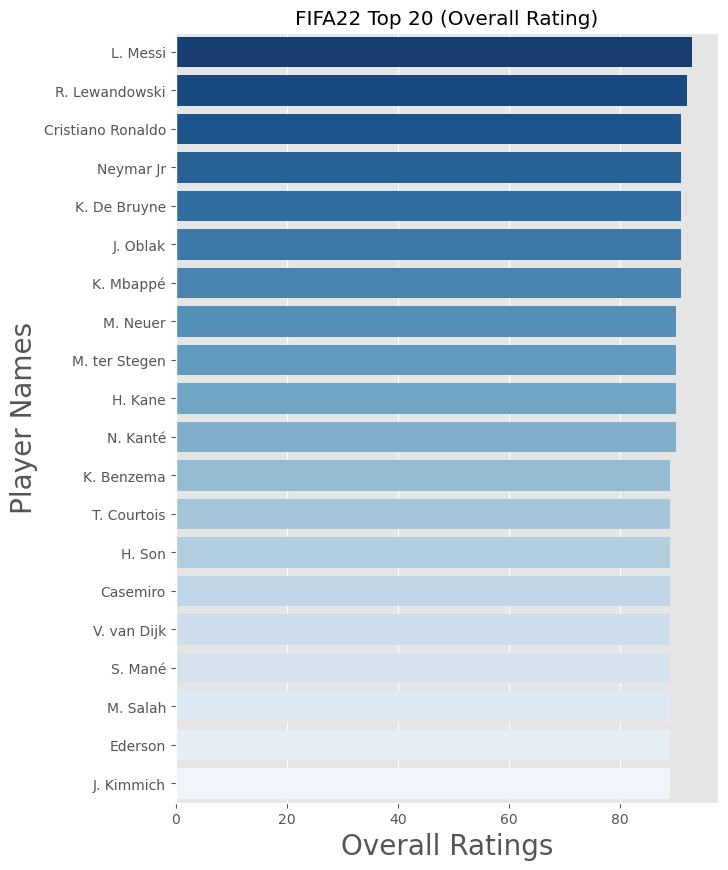

In [149]:
x = df['short_name'].head(20) 
y = df['overall'].head(20)

# plot
plt.figure(figsize=(7,10))


ax= sns.barplot(x=y, y=x, palette = 'Blues_r')
plt.xticks()
plt.xlabel('Overall Ratings', size = 20) 
plt.ylabel('Player Names', size = 20 ) 
plt.title('FIFA22 Top 20 (Overall Rating)')

plt.show()

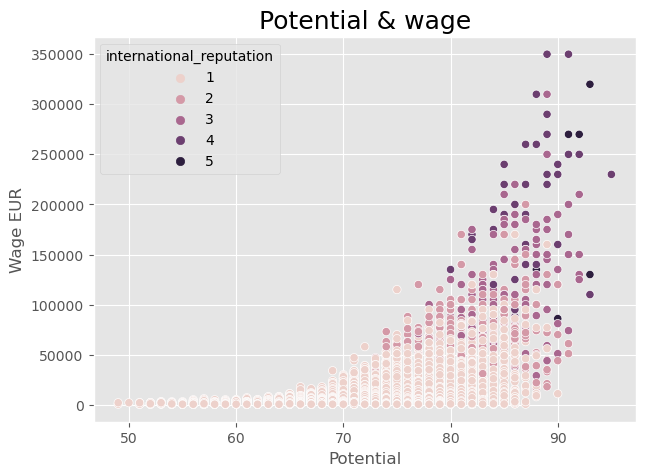

In [150]:
# Let's plot the relationship between player potential and wages, filtered by International reputation

plt.figure(figsize=(7, 5))
ax = sns.scatterplot(x =df['potential'], y = df['wage_eur'], hue = df['international_reputation'])
plt.xlabel("Potential") 
plt.ylabel("Wage EUR")
plt.title("Potential & wage", fontsize = 18)
plt.show()

### Players of high potentials tend to earn more and have more international reputation

## PairPlot

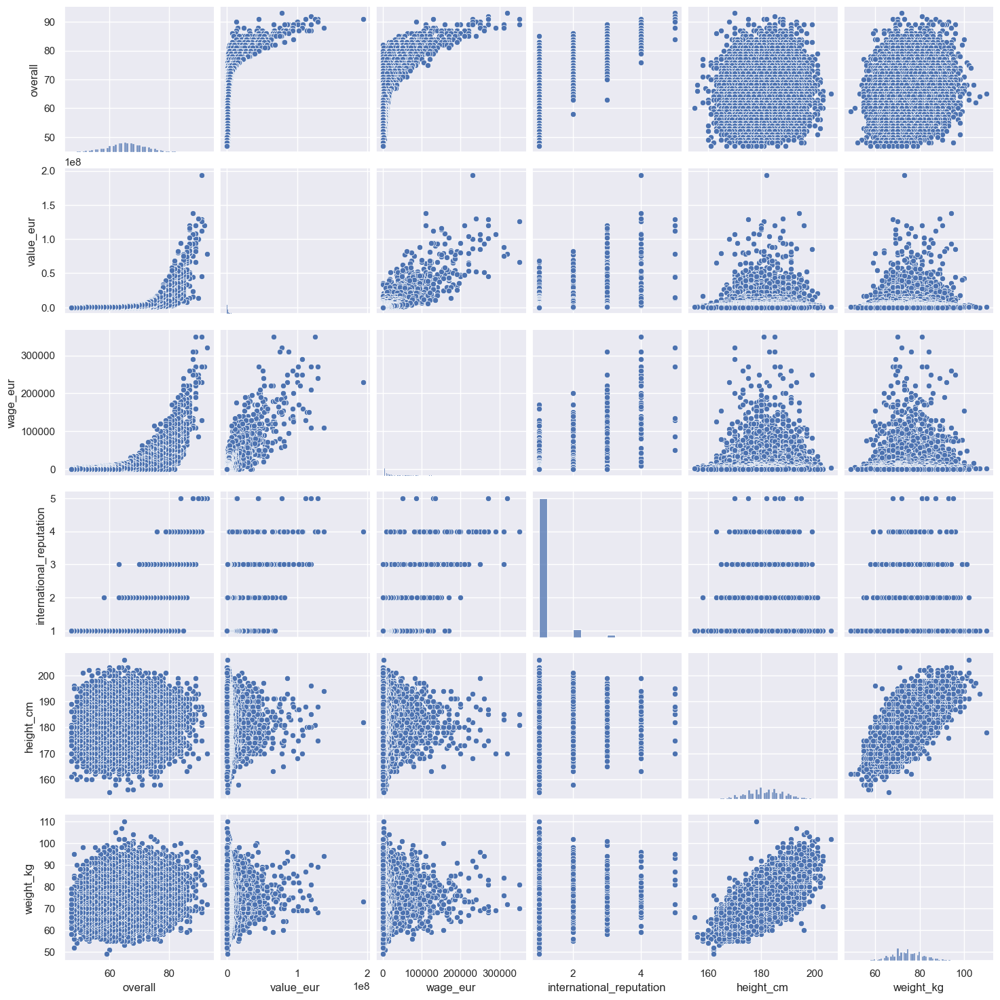

In [154]:
sns.set()
cols = ['overall', 'value_eur', 'wage_eur', 'international_reputation', 'height_cm', 'weight_kg'] 
sns.pairplot(df[cols], height = 2.5)
plt.show()

### There is high correlation between value and release clause, wage and release class, value and wage

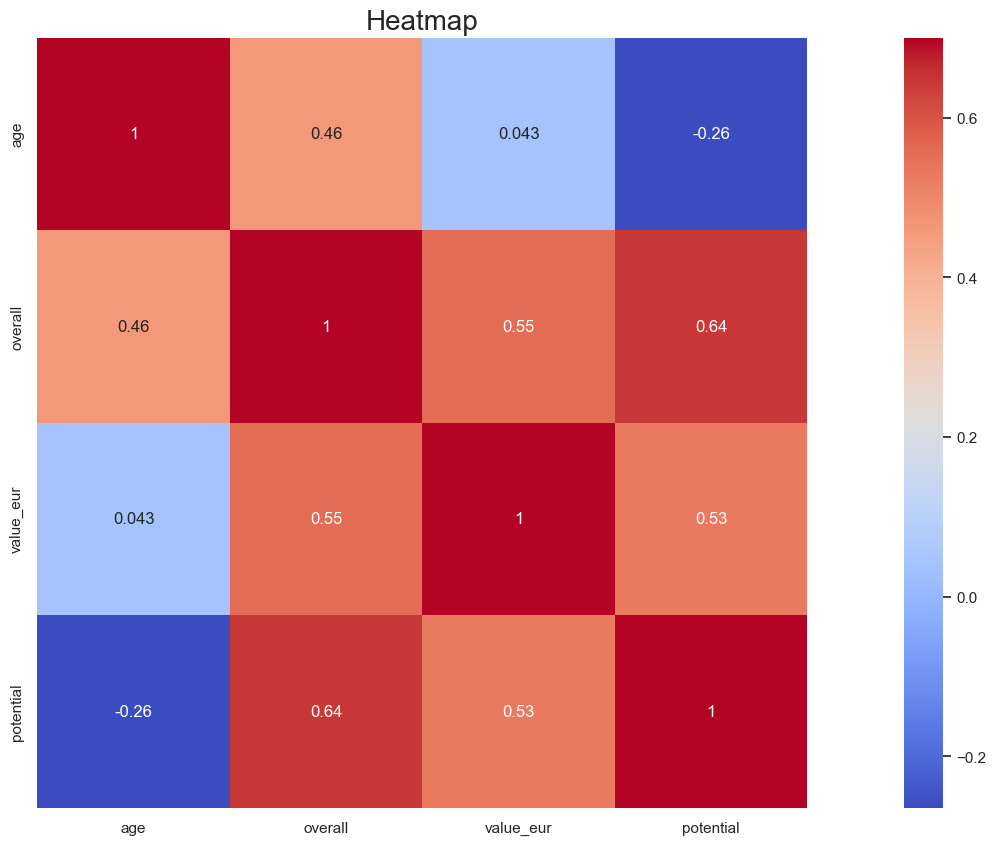

In [158]:
plt.subplots(figsize=(25, 10))
variables=['short_name','age','overall','value_eur','potential']
corr_matrix = df[variables].corr()
sns.heatmap(corr_matrix,square=True,vmax=0.7,annot=True,cmap='coolwarm')
plt.title(label='Heatmap', fontsize=20)
plt.show()

### There is a slight positive correlation between the Overall ratings and Value, since the correlation value is only 0.55

# WORDCLOUD

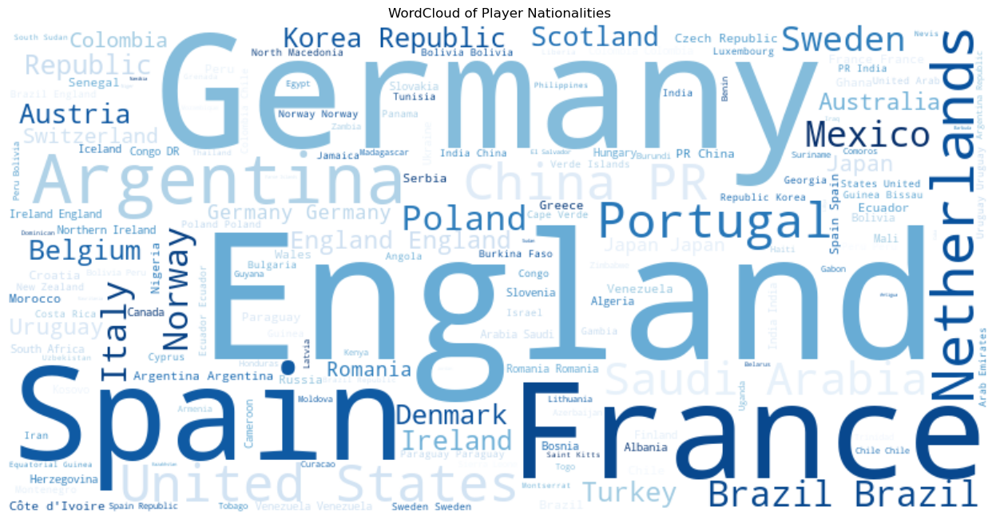

In [43]:
from wordcloud import WordCloud

text = ' '.join(df['nationality_name'].astype(str).tolist())
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Blues').generate(text)
plt.figure(figsize=(16,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('WordCloud of Player Nationalities')
plt.show()

# OBSERVATION

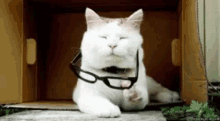

## There are 17981 players in this dataset.
## There are around 713 clubs with each club having around 30 players.
## Maximum number of players falls in the age group 25 to 30.
## Lionel Messi is the highest rated player with 94 overall rating.
## Majority of football players are right footed.
## There's a positive relationship between players potential rating & wages.
## England have the most representation among countries in the data, followed by Germany.

# Question - 2

In [48]:
# Young football players with age not more than 26 years
young_players = df[df['age'] < 26]

In [49]:
young_players

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
6,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé Lottin,"ST, LW",91,95,194000000.0,230000.0,22,...,54+3,54+3,54+3,63+3,18+3,https://cdn.sofifa.net/players/231/747/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1335/60.png,https://cdn.sofifa.net/flags/fr.png
21,230621,https://sofifa.com/player/230621/gianluigi-don...,G. Donnarumma,Gianluigi Donnarumma,GK,89,93,119500000.0,110000.0,22,...,31+3,31+3,31+3,31+3,87+3,https://cdn.sofifa.net/players/230/621/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1343/60.png,https://cdn.sofifa.net/flags/it.png
29,239085,https://sofifa.com/player/239085/erling-haalan...,E. Haaland,Erling Braut Haaland,ST,88,93,137500000.0,110000.0,20,...,60+3,60+3,60+3,60+3,19+3,https://cdn.sofifa.net/players/239/085/22_120.png,https://cdn.sofifa.net/teams/22/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1352/60.png,https://cdn.sofifa.net/flags/no.png
43,228702,https://sofifa.com/player/228702/frenkie-de-jo...,F. de Jong,Frenkie de Jong,"CM, CDM, CB",87,92,119500000.0,210000.0,24,...,78+3,78+3,78+3,82+3,18+3,https://cdn.sofifa.net/players/228/702/22_120.png,https://cdn.sofifa.net/teams/241/60.png,https://cdn.sofifa.net/flags/es.png,https://cdn.sofifa.net/teams/105035/60.png,https://cdn.sofifa.net/flags/nl.png
44,231281,https://sofifa.com/player/231281/trent-alexand...,T. Alexander-Arnold,Trent Alexander-Arnold,RB,87,92,114000000.0,150000.0,22,...,78+3,78+3,78+3,83+3,19+3,https://cdn.sofifa.net/players/231/281/22_120.png,https://cdn.sofifa.net/teams/9/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1318/60.png,https://cdn.sofifa.net/flags/gb-eng.png
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19234,261962,https://sofifa.com/player/261962/defu-song/220002,Song Defu,宋德福,CDM,47,52,70000.0,1000.0,22,...,46+2,46+2,46+2,48+2,15+2,https://cdn.sofifa.net/players/261/962/22_120.png,https://cdn.sofifa.net/teams/112541/60.png,https://cdn.sofifa.net/flags/cn.png,NaN,https://cdn.sofifa.net/flags/cn.png
19235,262040,https://sofifa.com/player/262040/caoimhin-port...,C. Porter,Caoimhin Porter,CM,47,59,110000.0,500.0,19,...,44+2,44+2,44+2,48+2,14+2,https://cdn.sofifa.net/players/262/040/22_120.png,https://cdn.sofifa.net/teams/445/60.png,https://cdn.sofifa.net/flags/ie.png,NaN,https://cdn.sofifa.net/flags/ie.png
19236,262760,https://sofifa.com/player/262760/nathan-logue/...,N. Logue,Nathan Logue-Cunningham,CM,47,55,100000.0,500.0,21,...,45+2,45+2,45+2,47+2,12+2,https://cdn.sofifa.net/players/262/760/22_120.png,https://cdn.sofifa.net/teams/111131/60.png,https://cdn.sofifa.net/flags/ie.png,NaN,https://cdn.sofifa.net/flags/ie.png
19237,262820,https://sofifa.com/player/262820/luke-rudden/2...,L. Rudden,Luke Rudden,ST,47,60,110000.0,500.0,19,...,26+2,26+2,26+2,32+2,15+2,https://cdn.sofifa.net/players/262/820/22_120.png,https://cdn.sofifa.net/teams/111131/60.png,https://cdn.sofifa.net/flags/ie.png,NaN,https://cdn.sofifa.net/flags/ie.png


# Hunt for 4 players - Goalkeeper, Defender, Midfielder & Attacker

In [52]:
goalkeeper = young_players[young_players['player_positions'] == 'GK'].sort_values('overall', ascending=False).iloc[0]
defender = young_players.sort_values('defending', ascending=False).iloc[0]
midfielder = young_players.sort_values('passing', ascending=False).iloc[0]
attacker = young_players.sort_values('shooting', ascending=False).iloc[0]


In [53]:
# Getting the names of the shortlisted players
print(f'Top goalkeeper: {goalkeeper["short_name"]}')
print(f'Top defender: {defender["short_name"]}')
print(f'Top midfielder: {midfielder["short_name"]}')
print(f'Top attacker: {attacker["short_name"]}')

Top goalkeeper: G. Donnarumma
Top defender: Rúben Dias
Top midfielder: T. Alexander-Arnold
Top attacker: E. Haaland


# That's It

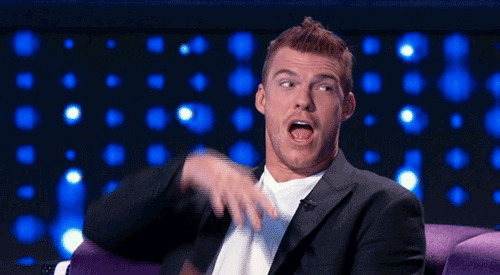